## Imports

In [42]:
import re
import json
import logging
import warnings
import plotly
import numpy as np
import pandas as pd
import sweetviz as sv
import seaborn as sns
import folium
import geopandas as gpd

from folium import plugins

from get_offers_by_city import connect
from pandas_profiling import ProfileReport

## NB configs

In [4]:
warnings.filterwarnings('ignore')

SEED = 43

%matplotlib inline
%pylab inline

plt.style.use('bmh')
plt.rcParams['figure.figsize'] = [16, 8]
plt.rcParams['font.size'] = 18

pd.options.display.max_columns = None
pd.options.display.max_rows = None
pd.set_option('display.expand_frame_repr', False)

sns.set()

plotly.offline.init_notebook_mode(connected=True)
plotly.offline.iplot

pd.options.display.max_rows = 300
pd.options.display.max_columns = 50

Populating the interactive namespace from numpy and matplotlib


## Helper functions

In [82]:
# Function to plot values upside the barplot
def annot_plot(plot):
    for p in plot.patches:
        plot.annotate(format(round(float(p.get_height()),2)), 
                       (p.get_x() + p.get_width() / 2., p.get_height()), 
                       ha = 'center', va = 'center', 
                       xytext = (0, 9), 
                       textcoords = 'offset points',
                       fontsize = 14)
    return None

## Load Data

In [6]:
df = pd.read_csv('../data/all_offers_infos_pp.csv')

In [7]:
df.head(2)

,offer_id,extraction_date,lat,lng,city,area_m2,furnished,zip_code,main_category,rooms,build_year,state,sub_category,balcony,heat_type,offer_title,kitchen,rent_price,garden
0,45875200,2021-11-11 20:51:08,52.59271,13.37819,Dresden,65.8,1,13158.0,Wohnung,2.0,1994.0,Berlin,Dachgeschosswohnung,0,Zentralheizung,Renovierungsbedürftige 2 DG Zimmer Wohnung *Te...,1,776.0,0
1,45678593,2021-11-11 20:51:08,50.10168,8.65827,Dresden,65.0,1,60327.0,Wohnung,3.0,1903.0,Hessen,Etagenwohnung,0,Zentralheizung,* frisch renovierte 3 Zimmerwohnung * Innensta...,0,790.0,0


In [8]:
df.shape

(6608, 19)

In [9]:
df.isna().sum()

offer_id              0
extraction_date       0
lat                   0
lng                   0
city                  0
area_m2             478
furnished             0
zip_code              1
main_category         0
rooms                67
build_year         1320
state                 0
sub_category          0
balcony               0
heat_type          2996
offer_title           0
kitchen               0
rent_price           13
garden                0
dtype: int64

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6595 entries, 0 to 6607
Data columns (total 19 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   offer_id         6595 non-null   int64  
 1   extraction_date  6595 non-null   object 
 2   lat              6595 non-null   float64
 3   lng              6595 non-null   float64
 4   city             6595 non-null   object 
 5   area_m2          6123 non-null   float64
 6   furnished        6595 non-null   int64  
 7   zip_code         6594 non-null   float64
 8   main_category    6595 non-null   object 
 9   rooms            6532 non-null   float64
 10  build_year       5280 non-null   float64
 11  state            6595 non-null   object 
 12  sub_category     6595 non-null   object 
 13  balcony          6595 non-null   int64  
 14  heat_type        3602 non-null   object 
 15  offer_title      6595 non-null   object 
 16  kitchen          6595 non-null   int64  
 17  rent_price    

## Feature Engineering

In [55]:
# Price x m2
df['price_m2'] = df['rent_price'] / df['area_m2']

In [59]:
df.columns

Index(['offer_id', 'extraction_date', 'lat', 'lng', 'city', 'area_m2',
       'furnished', 'zip_code', 'main_category', 'rooms', 'build_year',
       'state', 'sub_category', 'balcony', 'heat_type', 'offer_title',
       'kitchen', 'rent_price', 'garden', 'price_m2'],
      dtype='object')

In [61]:
df = df[[ 'extraction_date', 'offer_id', 'city', 'state', 'zip_code', 'lat', 'lng',
         'main_category', 'sub_category', 'offer_title', 'rent_price', 'area_m2', 
         'price_m2', 'rooms', 'balcony', 'kitchen', 'furnished', 'garden',  'build_year',
         'heat_type']]

## Descriptive Analysis

                                             |          | [  0%]   00:00 -> (? left)


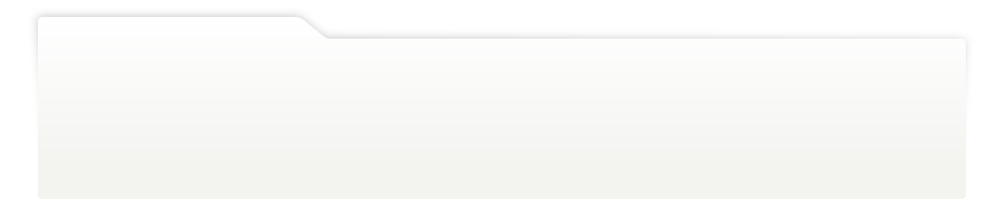
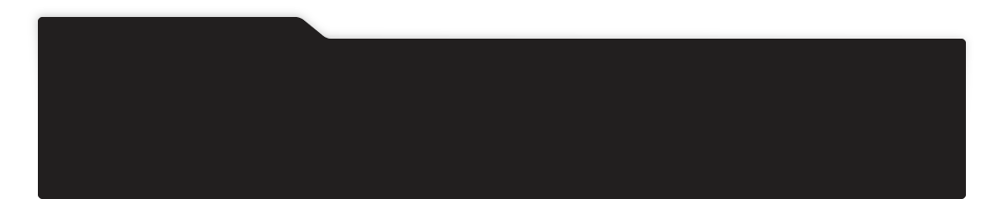
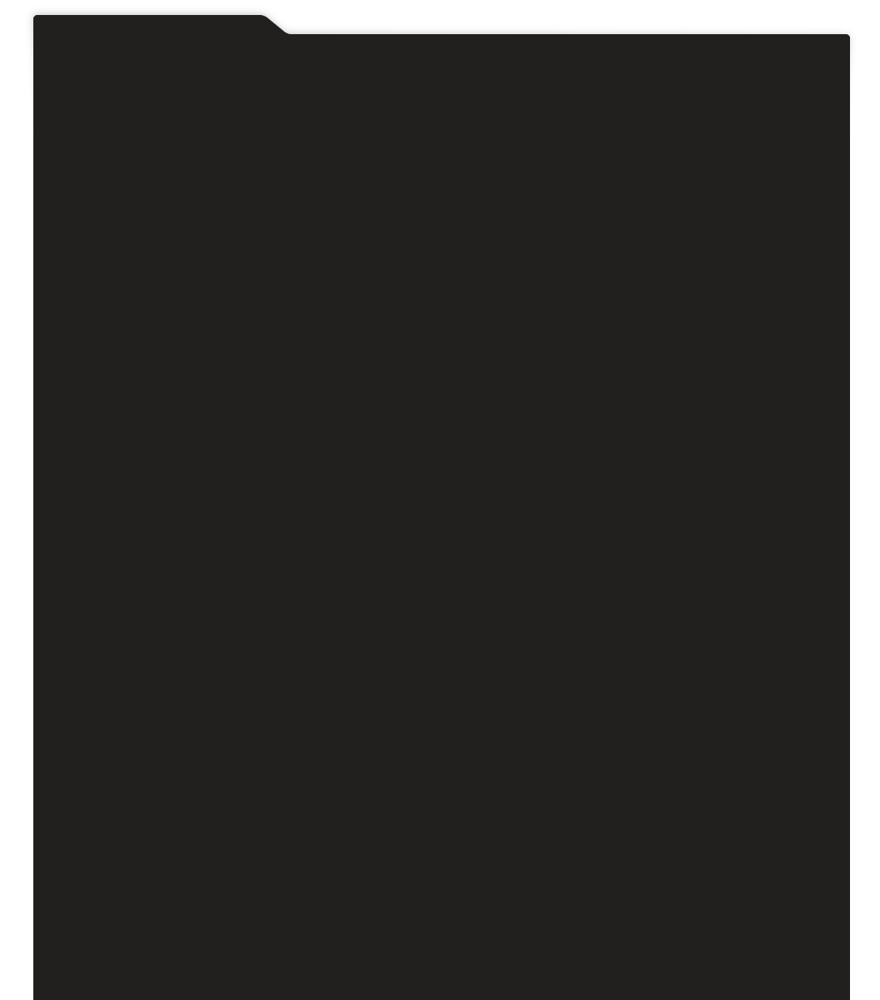
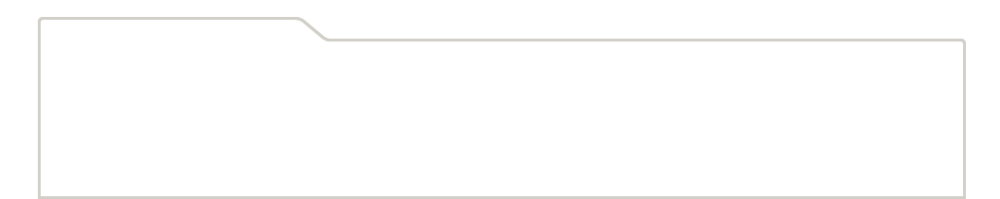
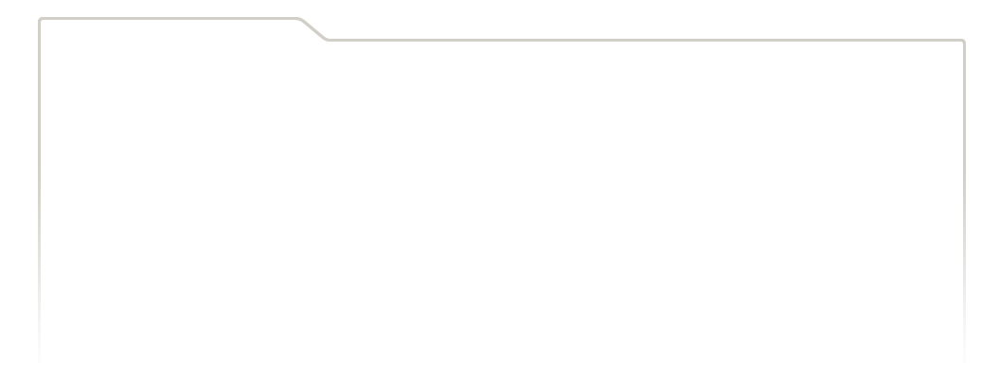
...
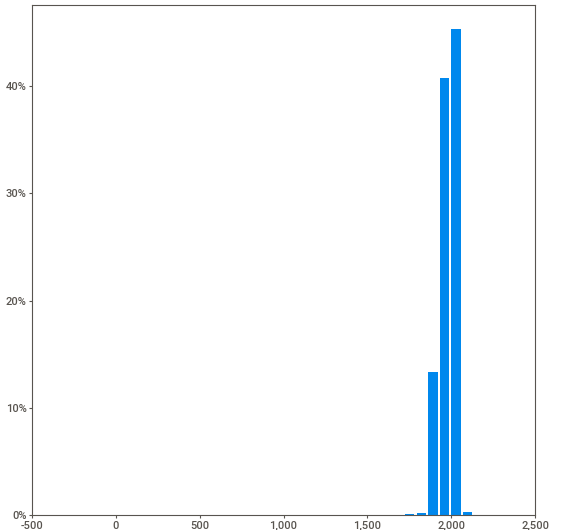
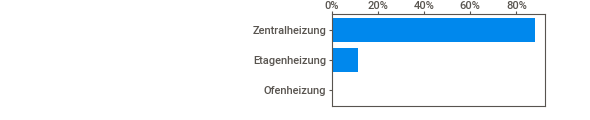
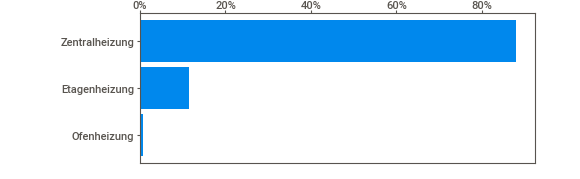
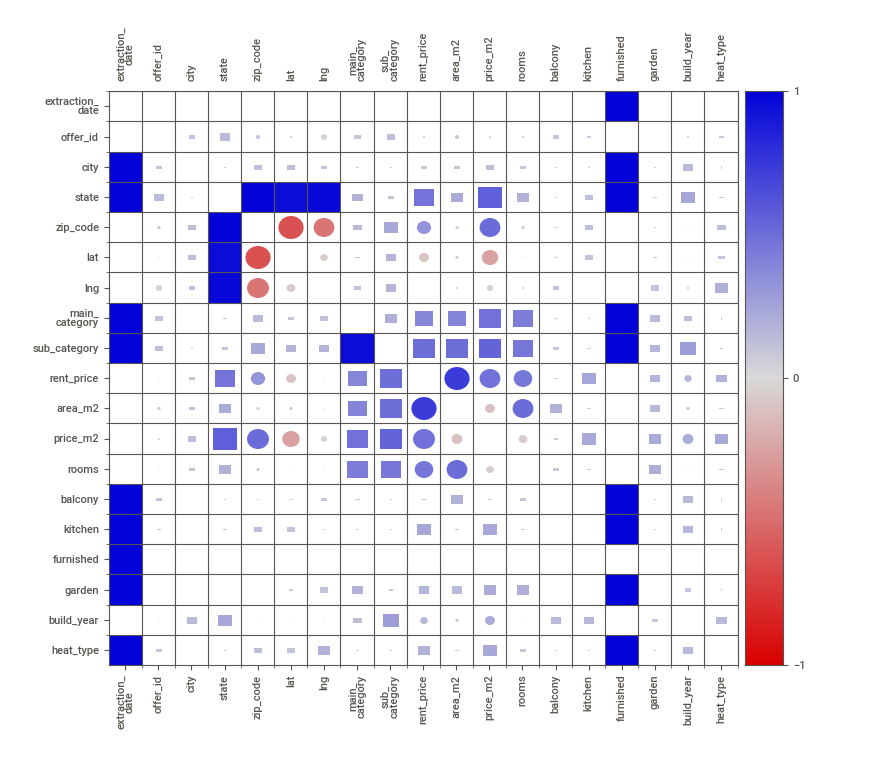
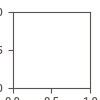

In [62]:
analysis = sv.analyze(df)
analysis.show_notebook()

DESCRIPTIVE NOTES (11/11/21)

* Area - minimum value found = 8m2.
    - find a minimum value to filter the dataset. 8m2 is too small for a place to live.

* Furnished - all places are furnished?
    - Check for some error in the data preparation process.
    
* Main Category - There are numbers as category.
    - Check it.
    
* Rooms - max value = 105, min value = 1.
    - Check max value - there are only one offer - probably an error.
    - 20.8% of the dataset have only one room.
 
* Build year - min value = 61.
    - A first century build?
    - There are serveral offers from the future. Build year bigger than 2021.
    
* REnt Price - min and max values.
    - min value = 3€, there are also values under 100€.
    - max value = 539000€ - too much for a rent.

## Data Cleaning

In [63]:
df1 = df.copy()

In [64]:
# remove NaN rows from rent_price - our main information can not have NaN values.

df1.dropna(subset=['rent_price'], inplace=True)

## EDA

In [65]:
df2 = df.copy()

# drop extraction date latitude and longitude - will not be used now
df2 = df2.drop(columns=['extraction_date', 'lat', 'lng'])

### Search for insights

- Check the rent price distributions.
- Check average rent price for each city.
- Check price/m2 for each city.
- Check price/m2 for each zip code.
- Check average price per years build.
- Check average price by state.
- Check average price by room.
- Check average price by sub-category.
- Check average price by heat type.

#### RENT PRICE X AREA

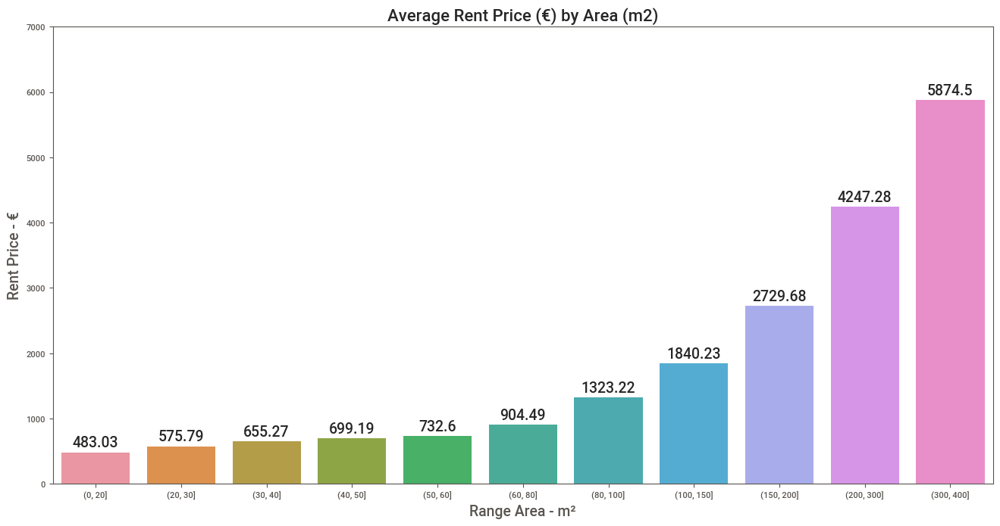

In [84]:
# create a auxiliar dataframe to aggregate the needed infos
df_aux = df2[['area_m2', 'rent_price']]
df_aux['range_area'] = pd.cut(df_aux['area_m2'], [0, 20, 30, 40, 50, 60, 80, 100, 150, 200, 300, 400])
df_aux2 = pd.DataFrame(df_aux.groupby('range_area')['rent_price'].mean().round(2)).reset_index()

# plot the infos
ax = sns.barplot(x=df_aux2['range_area'], y=df_aux2['rent_price'])
ax.set_title('Average Rent Price (€) by Area (m2)', fontsize=16)
ax.set_ylabel('Rent Price - €', fontsize=14)
ax.set_xlabel('Range Area - m²', fontsize=14)
ax.set(ylim=(0, 7000))
annot_plot(ax)
plt.savefig('../charts/avg_rent_by_m2.png')

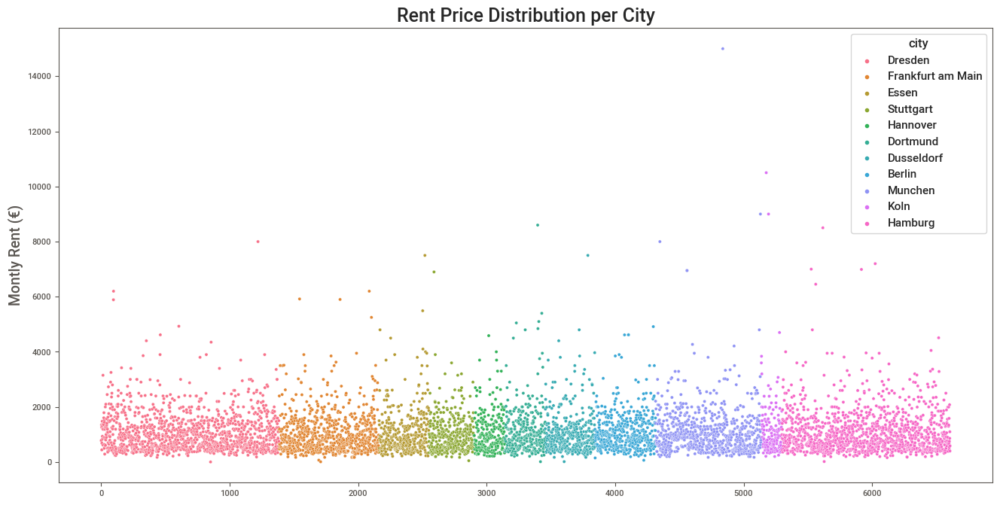

In [109]:
# scatterplot - all offers - Offer rent price by city

ax = sns.scatterplot(x = df2.index, y = 'rent_price', hue = 'city', data = df2)
plt.title('Rent Price Distribution per City', fontsize = 18)
plt.ylabel('Montly Rent (€)', fontsize = 14)
ax.figure.savefig(r'../images/rent_distribution_by_city.png')

In [80]:
df_aux

,city,rent_price
0,Berlin,1107.906977
1,Dortmund,1165.773885
2,Dresden,1059.734398
3,Dusseldorf,1069.623377
4,Essen,1087.563307
5,Frankfurt am Main,1043.764781
6,Hamburg,1072.529412
7,Hannover,1094.962025
8,Koln,1195.767296
9,Munchen,1102.800487


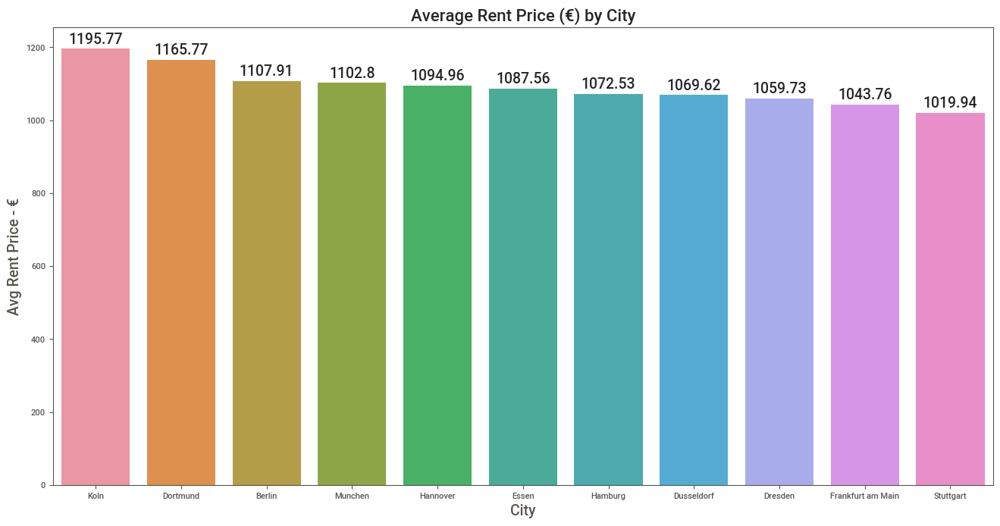

In [110]:
# Average rent price by city

df_aux = pd.DataFrame(df2.groupby('city')['rent_price'].mean()).reset_index().sort_values(by='rent_price', ascending=False)
# plot the infos
ax = sns.barplot(x=df_aux['city'], y=df_aux['rent_price'])
ax.set_title('Average Rent Price (€) by City', fontsize=16)
ax.set_ylabel('Avg Rent Price - €', fontsize=14)
ax.set_xlabel('City', fontsize=14)
annot_plot(ax)
plt.savefig('../charts/avg_rent_by_city.png')

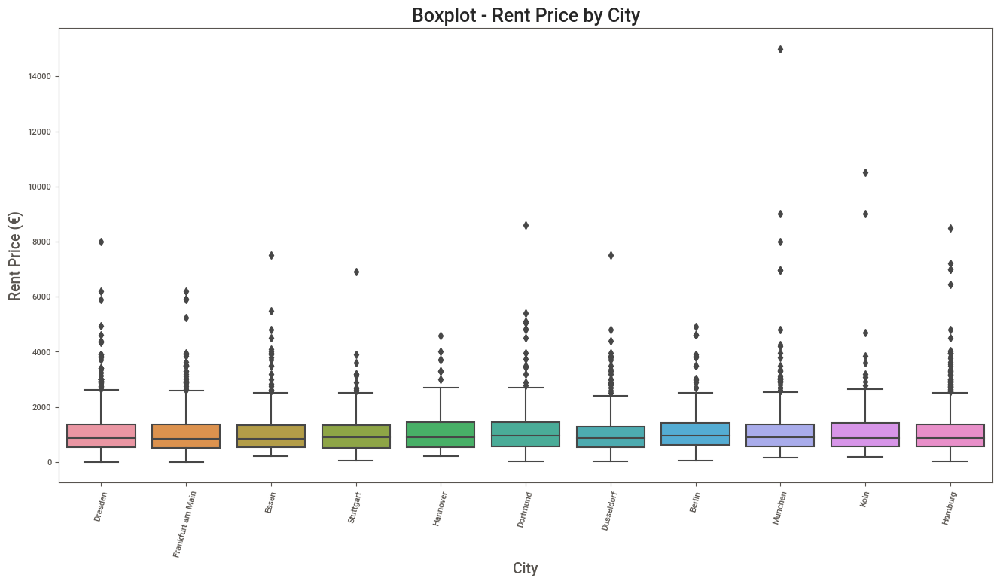

In [111]:
# boxrplot - all offers - Offer rent price by city

ax = sns.boxplot(x = 'city', y = 'rent_price', data = df2)
plt.title('Boxplot - Rent Price by City', fontsize = 18)
plt.ylabel('Rent Price (€)', fontsize = 14)
plt.xlabel('City', fontsize = 14)
plt.xticks(rotation=75);
ax.figure.savefig(r'../images/boxplot_rent_by_city.png')

#### m² PRICE

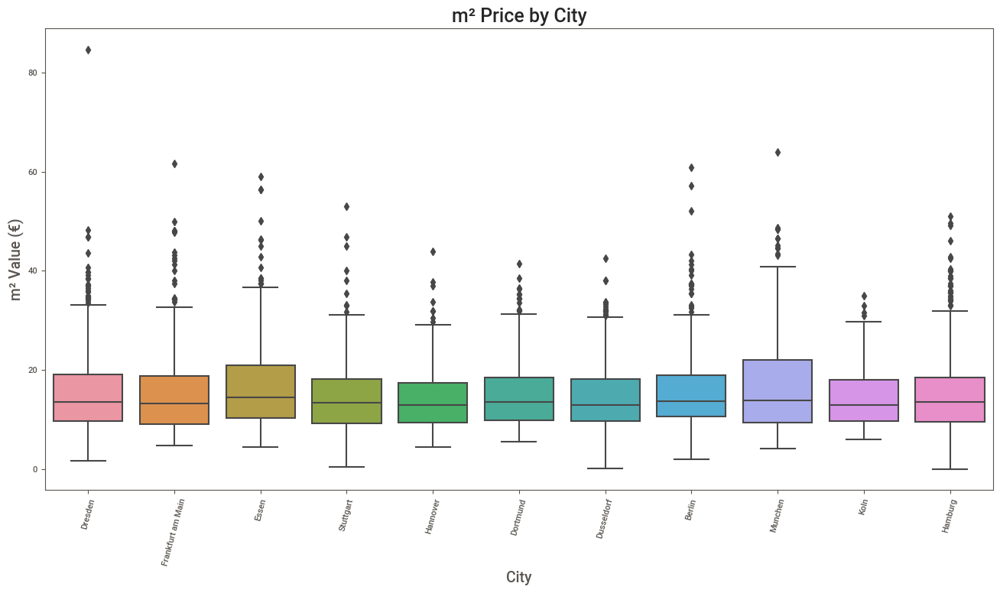

In [112]:
# m2 price by city

ax = sns.boxplot(x = 'city', y = 'price_m2', data = df2)
plt.title('m² Price by City', fontsize = 18)
plt.ylabel('m² Value (€)', fontsize = 14)
plt.xlabel('City', fontsize = 14)
plt.xticks(rotation=75);
ax.figure.savefig(r'../images/boxplot_m²_price_by_city.png')

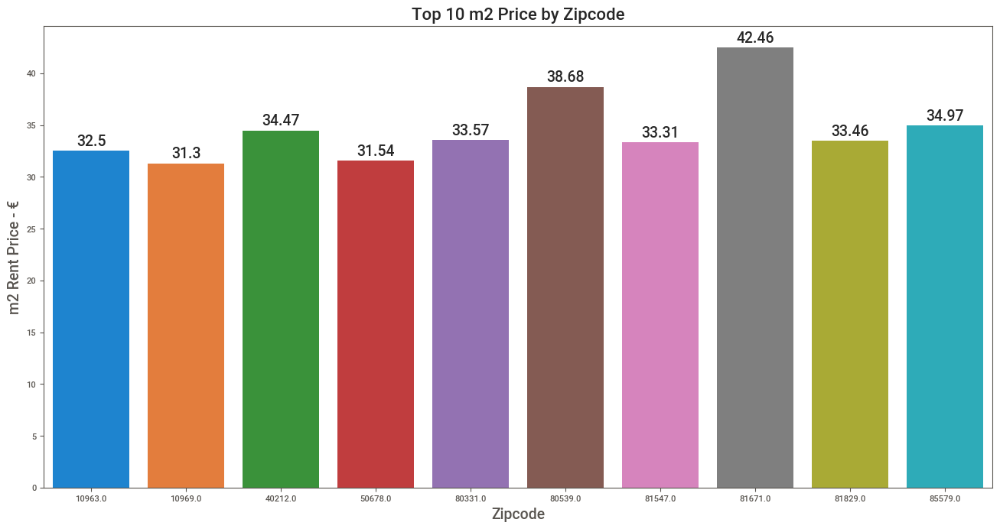

In [113]:
# m2 pice by zipcode

df_aux = pd.DataFrame(df2.groupby('zip_code')['price_m2'].mean()).reset_index().sort_values(by='price_m2', ascending=False).head(10)

ax = sns.barplot(x=df_aux['zip_code'], y=df_aux['price_m2'])
ax.set_title('Top 10 m2 Price by Zipcode', fontsize=16)
ax.set_ylabel('m2 Rent Price - €', fontsize=14)
ax.set_xlabel('Zipcode', fontsize=14)
annot_plot(ax)
plt.savefig('../charts/top10_expensivier_m2_by_zipcode.png')

### Main Hypotheses

1. Offers with larger areas are more expensive.
2. The more rooms, the more expensive.
3. Offers with garten are more expensive.
4. Offers with pre-installed kitchens are more expensive.
5. Offers in old buildings are less expensive.
6. Offers with balcony are more expensive.

#### 1. Offers with larger areas are more expensive.

In [23]:
# Strategy: group the areas by a range and compare them by average rent price.

df2['area_m2'].describe()

count    6123.000000
mean       67.971530
std        33.908757
min         8.000000
25%        48.000000
50%        63.000000
75%        81.825000
max       643.000000
Name: area_m2, dtype: float64

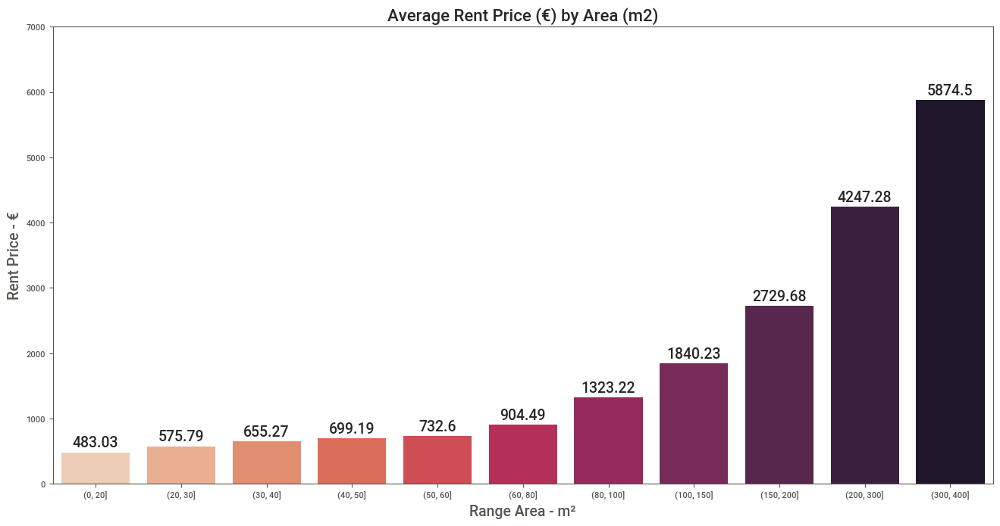

In [24]:
# create a auxiliar dataframe to aggregate the needed infos
df_aux = df2[['area_m2', 'rent_price']]
df_aux['range_area'] = pd.cut(df_aux['area_m2'], [0, 20, 30, 40, 50, 60, 80, 100, 150, 200, 300, 400])
df_aux2 = pd.DataFrame(df_aux.groupby('range_area')['rent_price'].mean().round(2)).reset_index()

# plot the infos
ax = sns.barplot(x=df_aux2['range_area'], y=df_aux2['rent_price'], palette="rocket_r")
ax.set_title('Average Rent Price (€) by Area (m2)', fontsize=16)
ax.set_ylabel('Rent Price - €', fontsize=14)
ax.set_xlabel('Range Area - m²', fontsize=14)
ax.set(ylim=(0, 7000))
annot_plot(ax)
plt.savefig('../charts/avg_rent_by_m2.png')

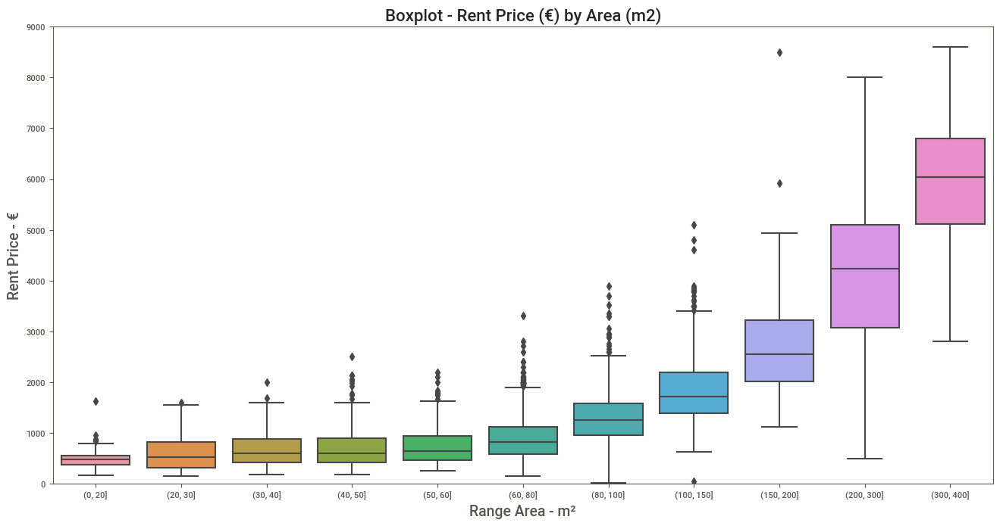

In [25]:
# boxplot
ax = sns.boxplot(x=df_aux['range_area'], y=df_aux['rent_price'])
ax.set_title('Boxplot - Rent Price (€) by Area (m2)', fontsize=16)
ax.set_ylabel('Rent Price - €', fontsize=14)
ax.set_xlabel('Range Area - m²', fontsize=14)
ax.set(ylim=(0, 9000))
plt.savefig('../charts/boxplot_rent_by_m2.png')

**HYPOTESIS 01 - True**

As expected, offers with larger areas are more expensive, at least when we refer to absolute values.

#### 02. The more rooms, the more expensive.

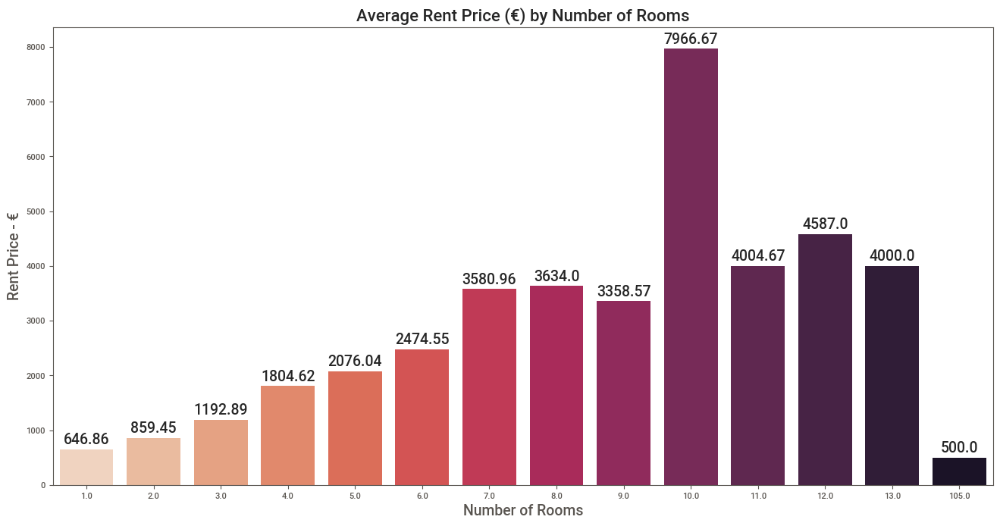

In [26]:
# create a auxiliar dataframe grouped by number of rooms
df_aux = df2[df2['rooms'] != NaN]
df_aux = pd.DataFrame(df.groupby('rooms')['rent_price'].mean().round(2)).reset_index()

# plot the infos
ax = sns.barplot(x=df_aux['rooms'], y=df_aux['rent_price'], palette="rocket_r")
ax.set_title('Average Rent Price (€) by Number of Rooms', fontsize=16)
ax.set_ylabel('Rent Price - €', fontsize=14)
ax.set_xlabel('Number of Rooms', fontsize=14)
#ax.set(ylim=(0, 8000))
annot_plot(ax)
plt.savefig('../charts/avg_rent_by_rooms.png')

#### 3. Offers with garten are more expensive.

#### 4. Offers with pre-installed kitchens are more expensive.

#### 5. Offers in old buildings are less expensive.

#### 6. Offers with balcony are more expensive.

#### Rent price distributions

<AxesSubplot:ylabel='rent_price'>

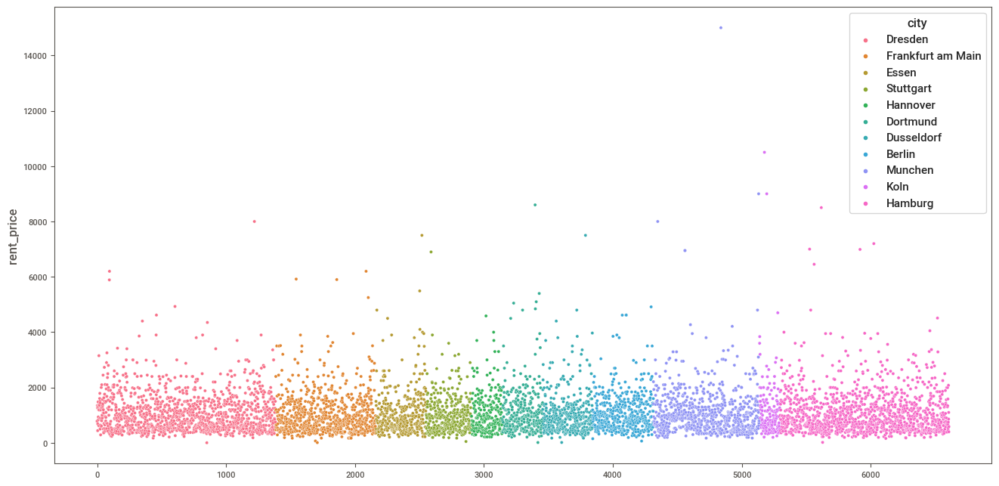

In [32]:
# Rent price X Area
sns.scatterplot(x=df2.index, y=df2['rent_price'], hue=df2['city'])

<AxesSubplot:xlabel='area_m2', ylabel='rent_price'>

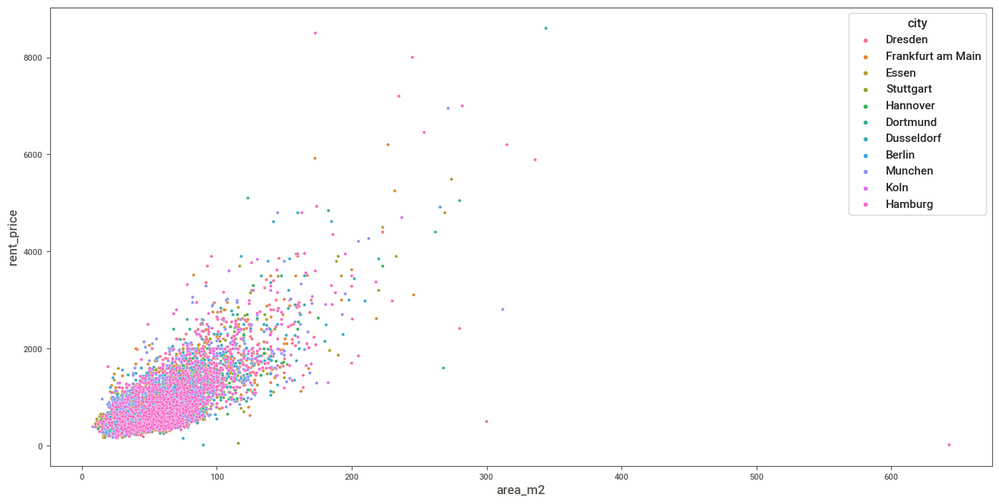

In [33]:
# Rent price X Area
sns.scatterplot(x=df['area_m2'], y=df['rent_price'], hue=df2['city'])

In [35]:
df1.head(1)

,offer_id,extraction_date,lat,lng,city,area_m2,furnished,zip_code,main_category,rooms,build_year,state,sub_category,balcony,heat_type,offer_title,kitchen,rent_price,garden
0,45875200,2021-11-11 20:51:08,52.59271,13.37819,Dresden,65.8,1,13158.0,Wohnung,2.0,1994.0,Berlin,Dachgeschosswohnung,0,Zentralheizung,Renovierungsbedürftige 2 DG Zimmer Wohnung *Te...,1,776.0,0


## Maps

In [40]:
## PLOT SESSOES E PARAGENS

# coordenates matosinhos
lat = 51.1642292 
long = 10.4541194

# create map
de_map1 = folium.Map(location=[lat, long], zoom_start=7)

rainbow = ['red', 'blue', 'orange', 'green', 'darkblue', 'black']

# add markers
for lat, lon in zip(df1['lat'],
                    df1['lng']):
    #label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=2,
        color = 'red',
        fill=True,
        fill_color= 'yellow',
        fill_opacity=0.4).add_to(de_map1)


de_map1

### Grouped offers with main infos

In [48]:
germany = '../geo_data/germany_cities.geo.json'
geo_json_data = json.load(open(germany))

de_map2 = folium.Map(location = [lat, long], zoom_start = 6)

prices = plugins.MarkerCluster().add_to(de_map2)


for lat, lng, i in zip(df1['lat'], df1['lng'], list(range(df1.shape[0]))):
    label = f'{df1["main_category"].values[i]} - Price: €{df1["rent_price"].values[i]} - Area: {df1["area_m2"].values[i]}m2'
    label = folium.Popup(label, parse_html = True)
    folium.Marker(
        location = [lat, lng],
        icon = None,
        popup = label).add_to(prices)
    
folium.GeoJson(geo_json_data, style_function=lambda feature: {'color': 'darkred','weight': 0.5,}).add_to(de_map2)

de_map2